In [1]:
GRAPH_FILEPATH = "../data/rock/performers_graph.json"
PERFORMERS_DIR = "../data/rock/performers"
GENRES_FILEPATH = "../data/rock/artist_genres.json"
COMMUNITY_FILEPATH = "../data/rock/community_detection_results.json"
PARTITION_FILEPATH = "../data/rock/community_detection_results_partition.json"

import sys
import os
import json
sys.path.append("..")

## Part 1

In [2]:
from lib.Loader import Loader

loader = Loader()
DG = loader.load_network(GRAPH_FILEPATH, directed=True)

Network loaded: 489 nodes, 13709 edges


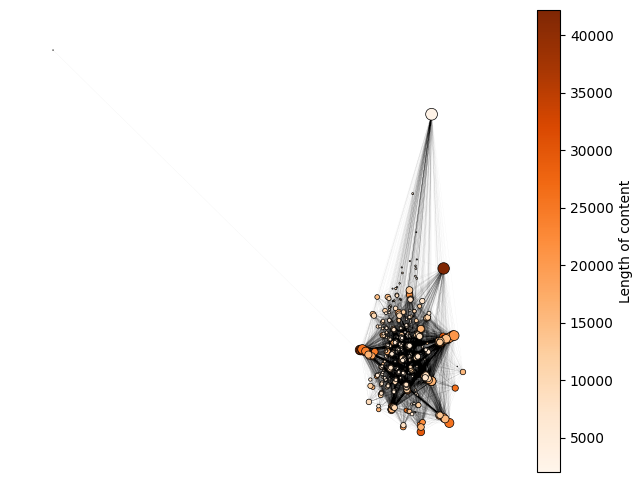

In [3]:
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.cm as cm
import matplotlib.colors as mcolors

values = [DG.nodes[n]['length_of_content'] for n in DG.nodes]
norm = mcolors.Normalize(vmin=min(values), vmax=max(values))
cmap = cm.Oranges
node_colors = [cmap(norm(v)) for v in values]

sizes = []
node_list = list(DG.nodes())
for node in node_list:
    sizes.append(DG.degree(node))

args = {
    "node_size": [size / 5 for size in sizes],
    "node_color": node_colors,
    "edge_color": "black",
    "node_shape": "o",
    "linewidths": 0.5,
    "width": 0.01,
    "edgecolors": "black",
    "font_color": "black",
    "with_labels": False,
    "arrows": False
}

fig, ax = plt.subplots(figsize=(8, 6))

node_mass = dict()
for node in node_list:
    node_mass[node] = DG.degree(node) + 1

atlas2_args = {
    "max_iter": 1000,
    "scaling_ratio": 1,
    "gravity": 5,
    "dissuade_hubs": False,
    "node_mass": node_mass,
    "node_size": node_mass,
}
pos = nx.forceatlas2_layout(DG, **atlas2_args)
nx.draw(DG, pos=pos, ax=ax, **args)

sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array(values)
fig.colorbar(sm, ax=ax, label="Length of content")

plt.show()

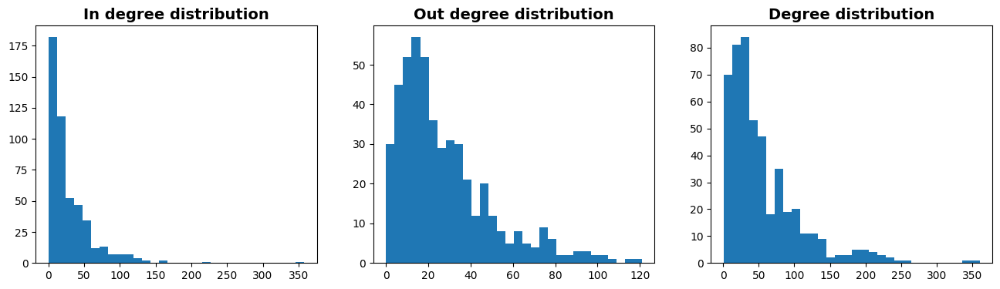

In [4]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
bins = 30

in_degrees = [DG.in_degree(node) for node in DG.nodes()]
out_degrees = [DG.out_degree(node) for node in DG.nodes()]
degrees = [DG.degree(n) for n in DG.nodes()]

axes[0].hist(in_degrees, bins=bins)
axes[0].set_title('In degree distribution', fontsize=14, weight='bold')

axes[1].hist(out_degrees, bins=bins)
axes[1].set_title('Out degree distribution', fontsize=14, weight='bold')

axes[2].hist(degrees, bins=bins)
axes[2].set_title('Degree distribution', fontsize=14, weight='bold')

plt.show()

In [5]:
import numpy as np
from scipy import stats

print(f'IN DEGREE:')
print(f'  - Mean: {np.mean(in_degrees)}')
print(f'  - Median: {np.median(in_degrees)}')
print(f'  - Mode: {stats.mode(in_degrees)[1]}')
print(f'  - Min: {np.min(in_degrees)}')
print(f'  - Max: {np.max(in_degrees)}')

print(f'\nOUT DEGREE:')
print(f'  - Mean: {np.mean(out_degrees)}')
print(f'  - Median: {np.median(out_degrees)}')
print(f'  - Mode: {stats.mode(out_degrees)[1]}')
print(f'  - Min: {np.min(out_degrees)}')
print(f'  - Max: {np.max(out_degrees)}')

IN DEGREE:
  - Mean: 28.03476482617587
  - Median: 17.0
  - Mode: 28
  - Min: 0
  - Max: 358

OUT DEGREE:
  - Mean: 28.03476482617587
  - Median: 21.0
  - Mode: 19
  - Min: 0
  - Max: 121


In [6]:
import powerlaw

in_degree_sequence = sorted(in_degrees)
in_degree_distribution, _ = np.histogram(in_degree_sequence, bins=range(in_degree_sequence[0], in_degree_sequence[-1] + 2))

out_degree_sequence = sorted(out_degrees)
out_degree_distribution, _ = np.histogram(out_degree_sequence, bins=range(out_degree_sequence[0], out_degree_sequence[-1] + 2))

degree_sequence = sorted(degrees)
degree_distribution, _ = np.histogram(degree_sequence, bins=range(degree_sequence[0], degree_sequence[-1] + 2))

alpha_in = powerlaw.Fit(in_degree_distribution).alpha
alpha_out = powerlaw.Fit(out_degree_distribution).alpha
alpha = powerlaw.Fit(degree_distribution).alpha

print(f'Alpha in: {alpha_in}')
print(f'Alpha out: {alpha_out}')
print(f'Alpha: {alpha}')

Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Alpha in: 5.363041076293169
Alpha out: 6.3420951536056345
Alpha: 7.363638451909018


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


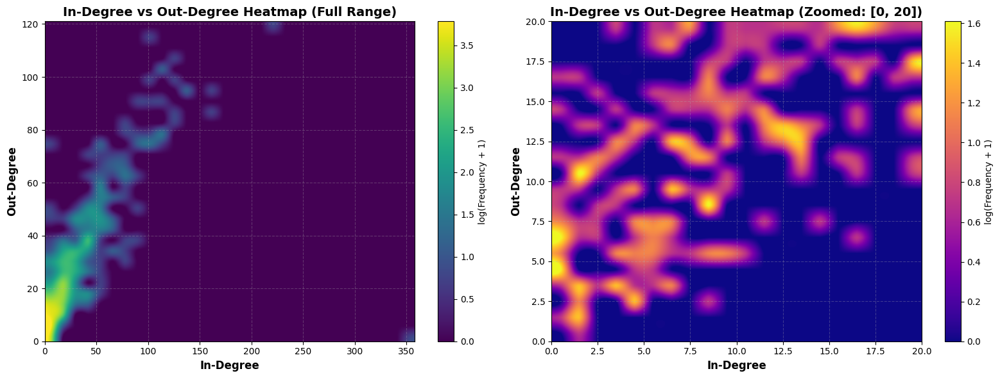

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Create heatmap for full range (optional - can show full distribution)
heatmap_full, xedges_full, yedges_full = np.histogram2d(in_degrees, out_degrees, bins=30)

# Create heatmap zoomed to [0, 20] range as requested in exercise
zoom_range = [0, 20]
bins_zoom = 20

# Filter data points within zoom range
in_out_pairs = [(d1, d2) for d1, d2 in zip(in_degrees, out_degrees) if 0 <= d1 <= 20 and 0 <= d2 <= 20]

if len(in_out_pairs) > 0:
    in_zoom = np.array([p[0] for p in in_out_pairs])
    out_zoom = np.array([p[1] for p in in_out_pairs])
    
    heatmap, xedges, yedges = np.histogram2d(in_zoom, out_zoom, bins=bins_zoom, range=[zoom_range, zoom_range])
    extent = zoom_range + zoom_range
else:
    heatmap = np.zeros((bins_zoom, bins_zoom))
    xedges = yedges = np.linspace(0, 20, bins_zoom + 1)
    extent = zoom_range + zoom_range

# Apply log scaling for better visualization (handle zeros)
heatmap_log = np.log1p(heatmap)  # log(1+x) to handle zeros

# Create figure with subplots: full view and zoomed view
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Full range heatmap
im1 = axes[0].imshow(np.log1p(heatmap_full.T), extent=[0, max(in_degrees), 0, max(out_degrees)], 
                     origin='lower', aspect='auto', cmap='viridis', interpolation='spline16')
axes[0].set_xlabel('In-Degree', fontsize=12, weight='bold')
axes[0].set_ylabel('Out-Degree', fontsize=12, weight='bold')
axes[0].set_title('In-Degree vs Out-Degree Heatmap (Full Range)', fontsize=14, weight='bold')
axes[0].grid(True, alpha=0.3, linestyle='--')
plt.colorbar(im1, ax=axes[0], label='log(Frequency + 1)')

# Zoomed heatmap [0, 20] range
im2 = axes[1].imshow(heatmap_log.T, extent=extent, origin='lower', aspect='auto', 
                     cmap='plasma', interpolation='spline16')
axes[1].set_xlabel('In-Degree', fontsize=12, weight='bold')
axes[1].set_ylabel('Out-Degree', fontsize=12, weight='bold')
axes[1].set_title('In-Degree vs Out-Degree Heatmap (Zoomed: [0, 20])', fontsize=14, weight='bold')
axes[1].grid(True, alpha=0.3, linestyle='--')
plt.colorbar(im2, ax=axes[1], label='log(Frequency + 1)')

plt.tight_layout()
plt.show()

In [8]:
locs = [DG.nodes[n]['length_of_content'] for n in DG.nodes]

in_degree_loc_correlation_spr = stats.spearmanr(in_degrees, locs)
out_degree_loc_correlation_spr = stats.spearmanr(out_degrees, locs)
in_out_degree_correlation_spr = stats.spearmanr(in_degrees, out_degrees)

print(f'SpearmanR correlation')
print(f'In degree / length of content: {in_degree_loc_correlation_spr.statistic}')
print(f'Out degree / length of content: {out_degree_loc_correlation_spr.statistic}')
print(f'In degree / out degree: {in_out_degree_correlation_spr.statistic}')


in_degree_loc_correlation_psr = stats.pearsonr(in_degrees, locs)
out_degree_loc_correlation_psr = stats.pearsonr(out_degrees, locs)
in_out_degree_correlation_psr = stats.pearsonr(in_degrees, out_degrees)

print(f'\nPearsonR correlation')
print(f'In degree / length of content: {in_degree_loc_correlation_psr.statistic}')
print(f'Out degree / length of content: {out_degree_loc_correlation_psr.statistic}')
print(f'In degree / out degree: {in_out_degree_correlation_psr.statistic}')

SpearmanR correlation
In degree / length of content: 0.6758769338548055
Out degree / length of content: 0.7612584968026866
In degree / out degree: 0.8072982403365454

PearsonR correlation
In degree / length of content: 0.654410206517591
Out degree / length of content: 0.7578333324759255
In degree / out degree: 0.7642809224470818


In [9]:
with open('../data/rock/performers_data.json', 'r', encoding='utf-8') as f:
    performers = json.load(f)

performers.sort(
    key=lambda x: int(DG.degree(x[0])) if isinstance(DG.degree(x[0]), int) else 0,
    reverse=True
)

for i, p in enumerate(list(performers[:5])):
    print(f'{i + 1}) {p[0]}')


betweenness_centralities = nx.betweenness_centrality(DG)
betweenness_centralities_list = [[k, v] for k, v in sorted(betweenness_centralities.items(), key=lambda item: item[1], reverse=True)]

for i, node in enumerate(betweenness_centralities_list[:5]):
    print(f'{i + 1}) {node[0]}: {node[1]}')

1) AllMusic
2) The Beatles
3) Led Zeppelin
4) The Rolling Stones
5) U2
1) The Beatles: 0.059425687847671965
2) Aerosmith: 0.027789004281114315
3) Queen (band): 0.02510524818945296
4) Black Sabbath: 0.025023050693104083
5) Led Zeppelin: 0.024752149993008527



Betweenness / degree correlation
SpearmanR: 0.8774924655104355
PearsonR: 0.8398246804091173


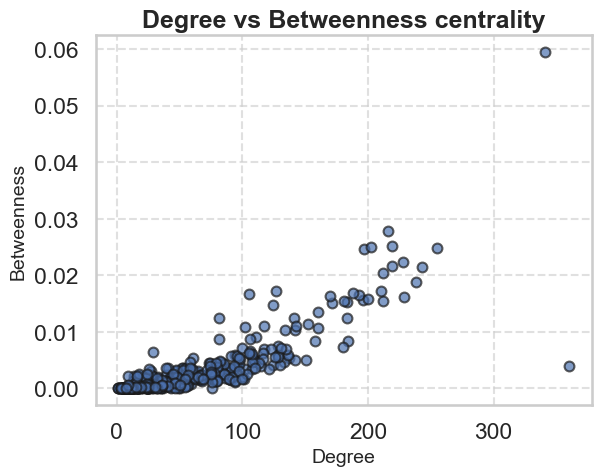

In [10]:
bcl = [v for k, v in betweenness_centralities.items()]

betweenness_degree_correlation_spr = stats.spearmanr(bcl, degrees)
betweenness_degree_correlation_psr = stats.pearsonr(bcl, degrees)

print(f'\nBetweenness / degree correlation')
print(f'SpearmanR: {betweenness_degree_correlation_spr.statistic}')
print(f'PearsonR: {betweenness_degree_correlation_psr.statistic}')

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", context="talk")

plt.scatter(
    degrees,
    bcl,
    s=50,
    alpha=0.7,
    edgecolors="k"
)
plt.title("Degree vs Betweenness centrality", fontsize=18, weight="bold")
plt.xlabel("Degree", fontsize=14)
plt.ylabel("Betweenness", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

In [11]:
UG = loader.load_network(GRAPH_FILEPATH, directed=False)
n = UG.number_of_nodes()
e = UG.number_of_edges()
p = e / (n * (n - 1) / 2)

RG = nx.erdos_renyi_graph(n=n, p=p)

print(f'UG nodes: {n}\nUG edges: {e}\nRG nodes: {RG.number_of_nodes()}\nRG edges: {RG.number_of_edges()}')

print(nx.average_shortest_path_length(UG))
print(nx.average_shortest_path_length(RG))

Network loaded: 489 nodes, 9600 edges
UG nodes: 489
UG edges: 9600
RG nodes: 489
RG edges: 9547
2.060930637969761
1.9621760702671895


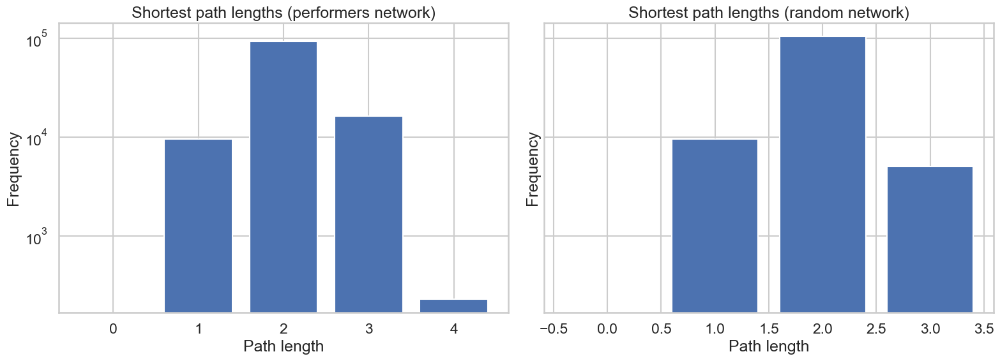

In [12]:
from lib.utils import extract_distribution


UG_path_lengths = nx.shortest_path_length(UG)
UG_paths = []
for source, lengths in UG_path_lengths:
    UG_paths.extend(lengths.values())
UG_bins, UG_heights = extract_distribution(UG_paths)
UG_heights = [b / 2 for b in UG_heights]


RG_path_lengths = nx.shortest_path_length(RG)
RG_paths = []
for source, lengths in RG_path_lengths:
    RG_paths.extend(lengths.values())
RG_path_lengths = nx.shortest_path_length(RG)
RG_bins, RG_heights = extract_distribution(RG_paths)
RG_heights = [b / 2 for b in RG_heights]


fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

axes[0].set_yscale('log')
axes[0].set_xlabel('Path length')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Shortest path lengths (performers network)')
axes[0].bar(x=UG_bins, height=UG_heights)

axes[1].set_yscale('log')
axes[1].set_xlabel('Path length')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Shortest path lengths (random network)')
axes[1].bar(x=RG_bins, height=RG_heights)

plt.tight_layout()
plt.show()

In [13]:
import matplotlib.pyplot as plt
import networkx as nx

# Get the largest connected component
if not nx.is_connected(UG):
    largest_cc = max(nx.connected_components(UG), key=len)
    UG = UG.subgraph(largest_cc).copy()

print(f"Working with undirected graph: {UG.number_of_nodes()} nodes, {UG.number_of_edges()} edges")

# Calculate edge betweenness centrality
print("\nCalculating edge betweenness centrality (this may take a while)...")
edge_betweenness = nx.edge_betweenness_centrality(UG, weight=None)

# Normalize edge betweenness to range [1, 100] for Weighted Network 1
eb_values = list(edge_betweenness.values())
eb_min = min(eb_values)
eb_max = max(eb_values)
eb_range = eb_max - eb_min if eb_max != eb_min else 1

# Create Weighted Network 1: weights proportional to edge betweenness (normalized 1-100)
G_weighted1 = UG.copy()
for (u, v), bet in edge_betweenness.items():
    if eb_range > 0:
        normalized_weight = 1 + ((bet - eb_min) / eb_range) * 99
    else:
        normalized_weight = 1
    G_weighted1[u][v]['weight'] = normalized_weight

print(f"Weighted Network 1 created: weights range from {min([d['weight'] for u, v, d in G_weighted1.edges(data=True)])} to {max([d['weight'] for u, v, d in G_weighted1.edges(data=True)])}")

# Create Weighted Network 2: weights proportional to 1/(weight in Network 1)
G_weighted2 = UG.copy()
for u, v, d in G_weighted1.edges(data=True):
    original_weight = d['weight']
    G_weighted2[u][v]['weight'] = 1.0 / original_weight

print(f"Weighted Network 2 created: weights range from {min([d['weight'] for u, v, d in G_weighted2.edges(data=True)]):.4f} to {max([d['weight'] for u, v, d in G_weighted2.edges(data=True)]):.4f}")

# For Weighted Network 3 (High-Salience Skeleton), we'll use a simple approximation
# The true HSS implementation requires the backbone package, but we can approximate it
# by using a threshold on shortest paths importance
print("\nCreating Weighted Network 3 (High-Salience Skeleton approximation)...")
# HSS is based on shortest paths, so we'll weight edges by their usage in shortest paths
G_weighted3 = UG.copy()
edge_usage = {edge: 0 for edge in UG.edges()}

# Sample shortest paths (to save computation time, we sample nodes)
sample_nodes = list(UG.nodes())[::max(1, UG.number_of_nodes() // 50)]  # Sample ~50 nodes
for source in sample_nodes:
    try:
        paths = nx.shortest_path(UG, source)
        for target, path in paths.items():
            if source != target and len(path) > 1:
                for i in range(len(path) - 1):
                    edge = tuple(sorted([path[i], path[i+1]]))
                    if edge in edge_usage:
                        edge_usage[edge] += 1
    except:
        continue

# Normalize usage counts to weights
usage_values = list(edge_usage.values())
usage_max = max(usage_values) if usage_values else 1
for (u, v), usage in edge_usage.items():
    G_weighted3[u][v]['weight'] = usage / usage_max if usage_max > 0 else 0.001

print(f"Weighted Network 3 created: weights based on shortest path usage")

# Now we'll implement the disparity filter based on the scientific paper
# The disparity filter uses statistical significance of edge weights
def disparity_filter(G_weighted, alpha=0.15):
    """
    Extract backbone using disparity filter.
    Based on: Serrano et al. (2009) "Extracting the multiscale backbone of complex weighted networks"
    
    Alpha is the significance level (typically 0.05-0.20)
    Lower alpha = more selective (fewer edges kept)
    Higher alpha = less selective (more edges kept)
    """
    
    G_backbone = nx.Graph()
    G_backbone.add_nodes_from(G_weighted.nodes())
    
    # For each node, calculate node strength (sum of edge weights)
    node_strengths = {}
    for node in G_weighted.nodes():
        strength = sum([G_weighted[node][neigh]['weight'] for neigh in G_weighted.neighbors(node)])
        node_strengths[node] = strength
    
    # Apply disparity filter to each edge
    for u, v, d in G_weighted.edges(data=True):
        weight = d['weight']
        deg_u = G_weighted.degree(u)
        deg_v = G_weighted.degree(v)
        s_u = node_strengths[u]
        s_v = node_strengths[v]
        
        # Calculate normalized weight (p-value approach)
        # For node u: normalized weight = weight / strength
        if s_u > 0 and deg_u > 1:
            p_u = weight / s_u
            # Statistical significance: p-value threshold
            # Simple approximation: keep if normalized weight > alpha threshold
            # (The full method uses more complex statistical tests)
            keep_edge_u = p_u > alpha
        else:
            keep_edge_u = False
            
        if s_v > 0 and deg_v > 1:
            p_v = weight / s_v
            keep_edge_v = p_v > alpha
        else:
            keep_edge_v = False
        
        # Keep edge if it passes the test at either endpoint
        if keep_edge_u or keep_edge_v:
            G_backbone.add_edge(u, v, **d)
    
    # Remove isolated nodes
    isolated = list(nx.isolates(G_backbone))
    G_backbone.remove_nodes_from(isolated)
    
    return G_backbone

# Extract backbones with alpha parameter
print("\nExtracting backbones with disparity filter...")
alpha = 0.15  # You can adjust this to get aesthetically pleasing results

G_backbone1 = disparity_filter(G_weighted1, alpha=alpha)
G_backbone2 = disparity_filter(G_weighted2, alpha=alpha)
G_backbone3 = disparity_filter(G_weighted3, alpha=alpha)

print(f"\nBackbone 1 (high edge betweenness): {G_backbone1.number_of_nodes()} nodes, {G_backbone1.number_of_edges()} edges")
print(f"Backbone 2 (low edge betweenness): {G_backbone2.number_of_nodes()} nodes, {G_backbone2.number_of_edges()} edges")
print(f"Backbone 3 (High-Salience Skeleton): {G_backbone3.number_of_nodes()} nodes, {G_backbone3.number_of_edges()} edges")


Working with undirected graph: 489 nodes, 9600 edges

Calculating edge betweenness centrality (this may take a while)...
Weighted Network 1 created: weights range from 1.0 to 100.0
Weighted Network 2 created: weights range from 0.0100 to 1.0000

Creating Weighted Network 3 (High-Salience Skeleton approximation)...
Weighted Network 3 created: weights based on shortest path usage

Extracting backbones with disparity filter...

Backbone 1 (high edge betweenness): 333 nodes, 350 edges
Backbone 2 (low edge betweenness): 213 nodes, 191 edges
Backbone 3 (High-Salience Skeleton): 465 nodes, 705 edges


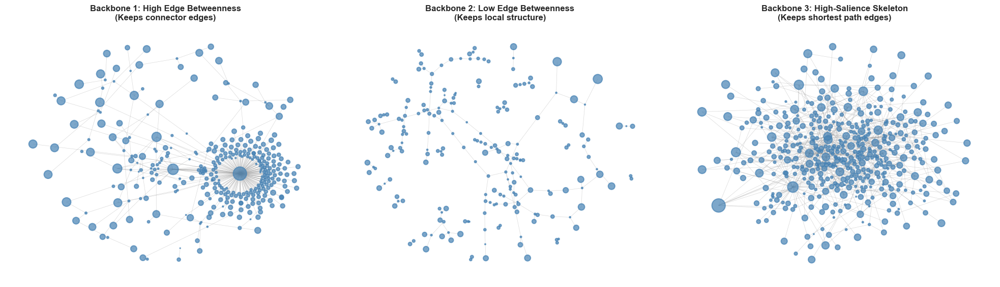


Visualizations complete!


In [14]:
# Step 2: Visualize the three backbones using ForceAtlas2

def visualize_backbone(G_backbone, title, ax):
    """
    Visualize a backbone network using ForceAtlas2.
    Node sizes are proportional to total degree in the original graph.
    """
    if G_backbone.number_of_nodes() == 0:
        ax.text(0.5, 0.5, 'No nodes in backbone', 
                ha='center', va='center', transform=ax.transAxes)
        ax.set_title(title)
        return
    
    # Calculate node sizes based on degree in original UG
    node_sizes = []
    node_list = list(G_backbone.nodes())
    for node in node_list:
        if node in UG:
            node_sizes.append(UG.degree(node))  # Scale for visibility
        else:
            node_sizes.append(10)
    
    # Try ForceAtlas2, fall back to spring layout if not available
    try:
        node_mass = {node: UG.degree(node) + 1 if node in UG else 1 for node in node_list}
        pos = nx.forceatlas2_layout(G_backbone, 
                                   max_iter=350,
                                   scaling_ratio=5.5,
                                   gravity=1.7,
                                   dissuade_hubs=True,
                                   node_mass=node_mass,
                                   node_size=node_mass)
    except:
        print(f"ForceAtlas2 not available for {title}, using spring layout")
        pos = nx.spring_layout(G_backbone, k=1, iterations=50)
    
    # Draw the network
    nx.draw_networkx_nodes(G_backbone, pos, 
                          node_size=node_sizes,
                          node_color='steelblue',
                          alpha=0.7,
                          ax=ax)
    nx.draw_networkx_edges(G_backbone, pos,
                          edge_color='gray',
                          alpha=0.3,
                          width=0.5,
                          ax=ax)
    
    ax.set_title(title, fontsize=12, weight='bold')
    ax.axis('off')

# Create figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Visualize each backbone
visualize_backbone(G_backbone1, 'Backbone 1: High Edge Betweenness\n(Keeps connector edges)', axes[0])
visualize_backbone(G_backbone2, 'Backbone 2: Low Edge Betweenness\n(Keeps local structure)', axes[1])
visualize_backbone(G_backbone3, 'Backbone 3: High-Salience Skeleton\n(Keeps shortest path edges)', axes[2])

plt.tight_layout()
plt.show()

print("\nVisualizations complete!")


## Part 2

Using the genres to subdivide the artists network into communities might initially seem a reasonable idea. However, by using the modularity measure, the analysis must be conducted using only one genre as label for each artist/band, greatly weakening its potential, since most artist/bands contain multiple genres in their wikipedia infobox.

Moreover "rock-related" genres like hard rock, alternative rock, etc... are by far the most frequent among all artists, realistically rendering the subdivision into distinct communities infeasible.

For the two main reasons listed above, applying different criterions to choose the genre among the ones listed in the infobox would probably not solve the issue.

In [16]:
from lib.CommunityDetector import CommunityDetector

community_detector = CommunityDetector()

print("="*70)
print("STRUCTURAL COMMUNITY DETECTION (Louvain Algorithm)")
print("="*70)

artist_genres = loader.load_artist_genres(GENRES_FILEPATH)

# Filter to nodes with genres
UG_filtered = community_detector.filter_network_by_genres(UG, artist_genres)

# Make sure network is connected or work with largest component
if not nx.is_connected(UG_filtered):
    print("\nNetwork is not fully connected. Working with largest connected component...")
    largest_cc = max(nx.connected_components(UG_filtered), key=len)
    UG_filtered = UG_filtered.subgraph(largest_cc).copy()
    print(f"Largest component: {UG_filtered.number_of_nodes()} nodes, {UG_filtered.number_of_edges()} edges")

communities, partition = community_detector.detect_communities_louvain(UG_filtered, seed=42)

print("\nCalculating modularity of detected communities...")
structural_modularity = community_detector.calculate_modularity_networkx(UG_filtered, partition)

STRUCTURAL COMMUNITY DETECTION (Louvain Algorithm)
Genre data loaded for 488 artists


Filtered network: 488 nodes, 9241 edges

Detecting communities using Louvain algorithm...
Number of communities detected: 5
Largest community size: 158
Smallest community size: 44
Average community size: 97.6

Top 10 largest communities:
   1. Community   1:  158 nodes
   2. Community   0:  122 nodes
   3. Community   3:   90 nodes
   4. Community   2:   74 nodes
   5. Community   4:   44 nodes

Calculating modularity of detected communities...


### Modularity of structural communities

- structural_modularity > 0.4: EXCELLENT - Very strong community structure
- structural_modularity > 0.3: GOOD - Strong community structure
- structural_modularity > 0.2: MODERATE - Moderate community structure
- structural_modularity < 0.2: WEAK - Weak community structure


COMPARISON WITH GENRE-BASED COMMUNITIES

Method                                     Modularity
-------------------------------------------------------
Structural (Louvain)                           0.2827
Genre - First Genre                            0.0713
Genre - First Non-Rock                         0.0611
Genre - Random                                 0.0285

VISUALIZING NETWORK

Coloring the 10 largest communities
Remaining nodes will be shown in light gray



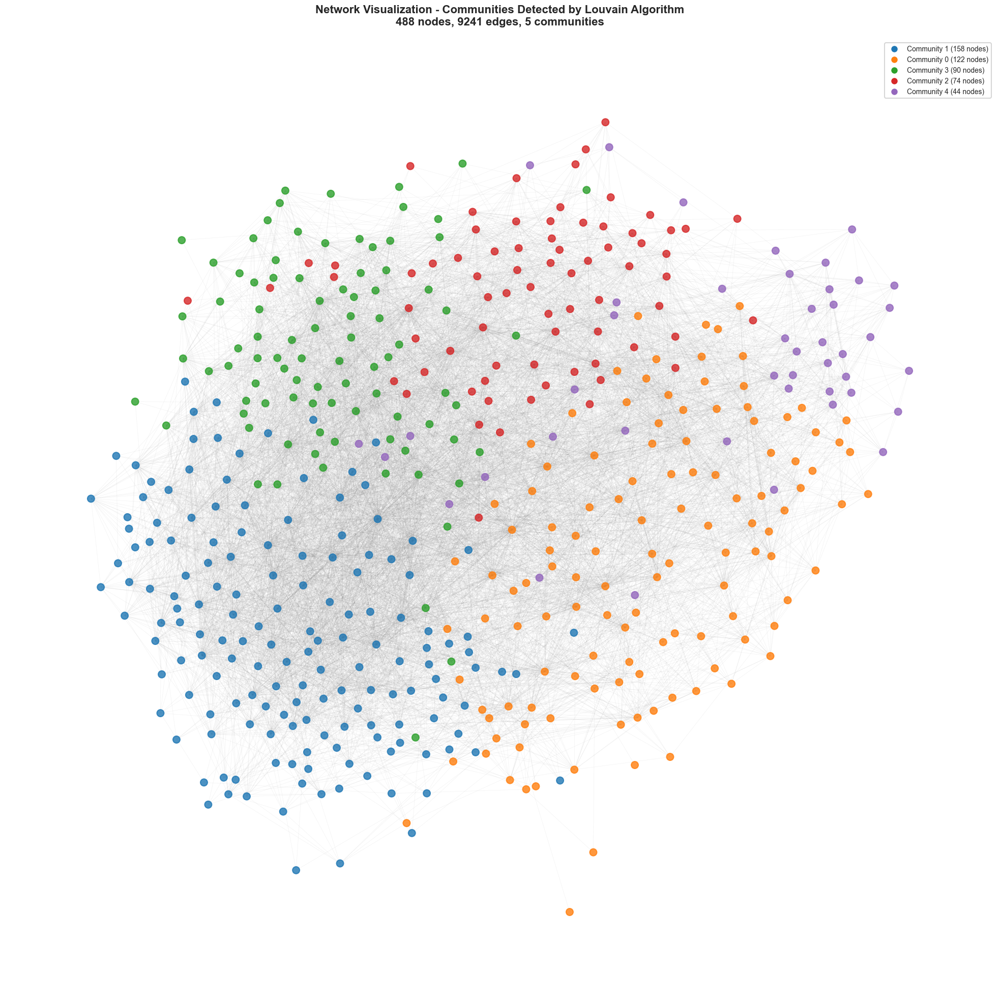

In [17]:
community_detector.compare_with_genre_modularity(structural_modularity)

community_detector.visualize_communities(UG_filtered, partition, max_colored_communities=10)

community_detector.save_community_results(UG_filtered, communities, partition, structural_modularity, COMMUNITY_FILEPATH)

Structural communities show +296.3% modularity vs best genre method

The Louvain algorithm found SIGNIFICANTLY better communities than genres.
This suggests that:
- Network structure is driven by factors beyond just genre
- Collaborations, influences, and connections cross genre boundaries
- The 'true' communities are based on the actual network topology

### Backbone extraction

This removes less important edges and highlights key connections


Extracting backbone using edge_betweenness method with alpha=0.2...
Backbone extracted: 481 nodes, 1848 edges
Removed 7 isolated nodes

VISUALIZING BACKBONE WITH COMMUNITIES

Coloring the 10 largest communities in backbone
Backbone has 481 nodes and 1848 edges



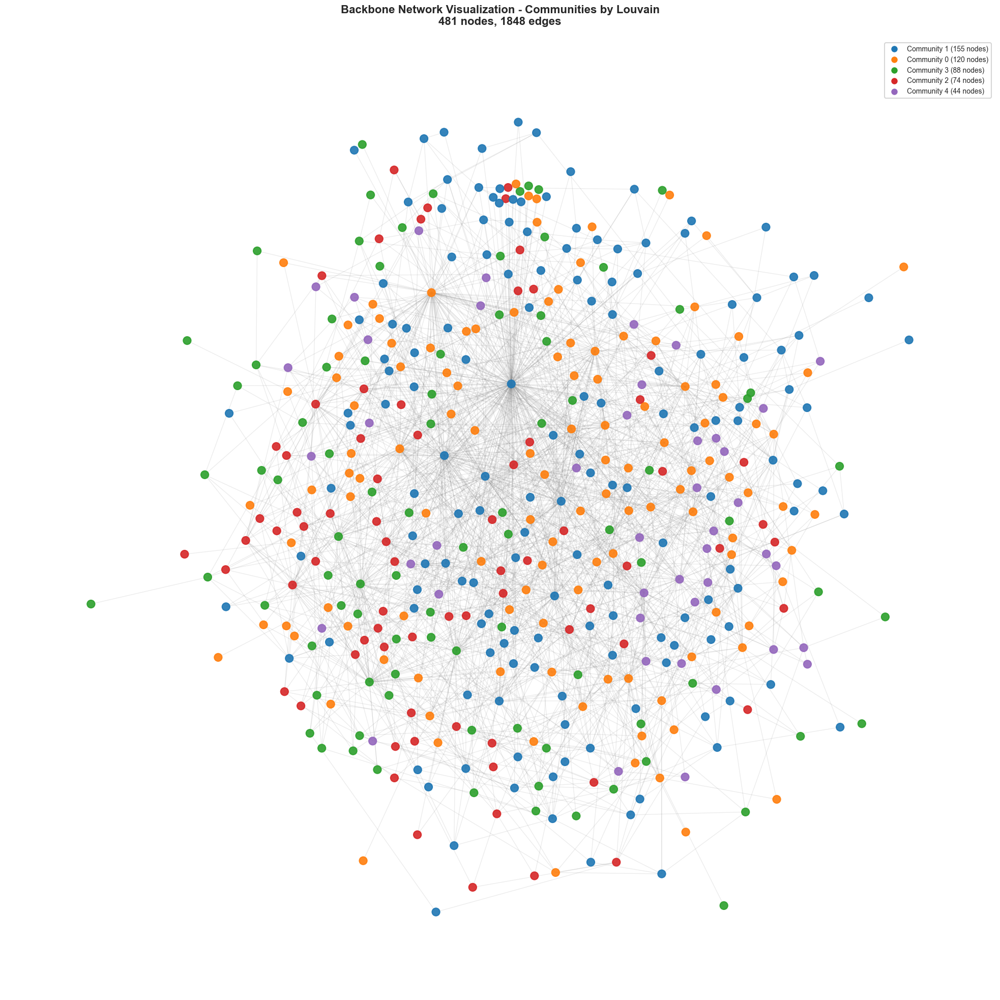

In [18]:
UG_backbone = community_detector.extract_backbone_edges(UG_filtered, method='edge_betweenness', alpha=0.20)
    
community_detector.visualize_backbone_communities(UG_backbone, partition, max_colored_communities=10)

### Difference between Louvain results and genres communities


Genre data loaded for 488 artists

Partition loaded for 488 artists

CREATING CONFUSION MATRIX

Top 7 genres:
  1. hard rock                      (149 occurrences)
  2. alternative rock               (147 occurrences)
  3. pop rock                       (108 occurrences)
  4. rock                           (84 occurrences)
  5. alternative metal              (62 occurrences)
  6. blues rock                     (57 occurrences)
  7. heavy metal                    (52 occurrences)

Top 7 communities:
  1. Community 1     (158 nodes)
  2. Community 0     (122 nodes)
  3. Community 3     (90 nodes)
  4. Community 2     (74 nodes)
  5. Community 4     (44 nodes)

Total artists included in confusion matrix: 402

VISUALIZING CONFUSION MATRIX


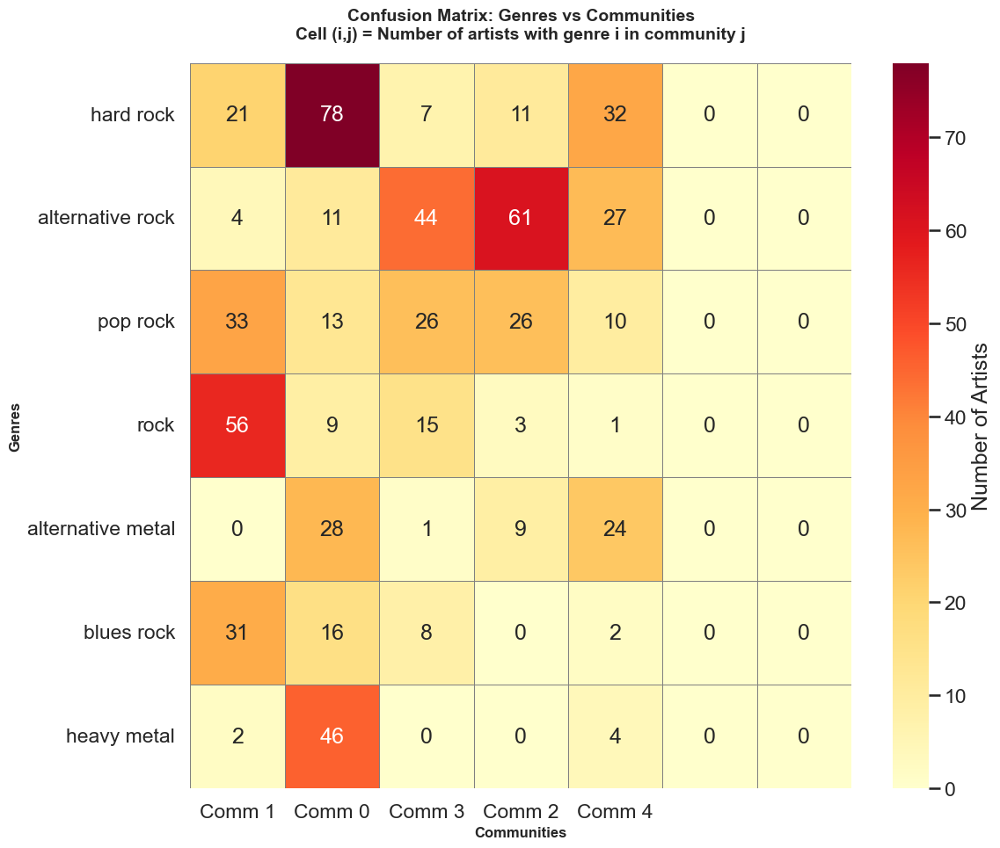


ALIGNMENT METRICS

Average Community Purity: 0.416
  (Higher = communities are more homogeneous in terms of genre)

Average Genre Completeness: 0.542
  (Higher = genres are more concentrated in single communities)

Max Overlap Score: 0.505
  (Ratio of artists in dominant communities for their genres)


In [19]:
from lib.ConfusionMatrixAnalyzer import ConfusionMatrixAnalyzer

confusion_matrix_analyzer = ConfusionMatrixAnalyzer()

artist_genres = loader.load_artist_genres(GENRES_FILEPATH)
partition = loader.load_partition(PARTITION_FILEPATH)

confusion_matrix, genre_labels, community_labels = confusion_matrix_analyzer.create_confusion_matrix(
    artist_genres, partition, top_n_genres=7, top_n_communities=7
)

confusion_matrix_analyzer.visualize_confusion_matrix(confusion_matrix, genre_labels, community_labels)
confusion_matrix_analyzer.analyze_confusion_matrix(confusion_matrix, genre_labels, community_labels)
confusion_matrix_analyzer.save_confusion_matrix_results(confusion_matrix, genre_labels, community_labels)

MODERATE ALIGNMENT: Communities partially correspond to genres
- Some communities align with genres, but there's significant mixing
- Network structure is influenced by genre but not determined by it
- Other factors (collaborations, era, style) also shape communities

Key Insights:
- Genres with high concentration: Artists mainly collaborate within genre
- Genres with low concentration: Artists collaborate across genre boundaries
- Communities with mixed genres: Cross-genre musical movements or eras
- Communities with pure genres: Genre-specific sub-networks

## Part 3

TF-IDF is a measure developed in order to evaluate the importance of a term to a document in a collection of documents. It is the product of two main parts:
- $\text{tf}(t, d)$ (term frequency): it measures how frequent a term $t$ is in a document $d$;
- $\text{idf}(t, D)$ (inverse document frequency): it measures how frequent a term $t$ is in the whole collection of documents $D$;

There are many ways to calculate both $tf$ and $idf$, but the crucial concept is that $\text{tf-idf} = \text{tf} \cdot \text{idf}$ takes into consideration both the importance of a word in a specific text, and the overall frequency of that word across all documents.

It is thus possible to grasp the true nature of a text. In our case, it is possible to produce a description of a musical genre made up of the most important words to that genre.

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\longo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!



Available TF analysis methods:
  1. all_genres
  2. first_genre
  3. first_non_rock

Using method: all_genres
(You can change 'selected_method' in the script to try other methods)

Loaded TF data for 15 genres


CREATING COMBINED WORD CLOUD GRID
Adding hard rock to grid (1/15)
Adding alternative rock to grid (2/15)
Adding pop rock to grid (3/15)
Adding rock to grid (4/15)
Adding alternative metal to grid (5/15)
Adding blues rock to grid (6/15)
Adding heavy metal to grid (7/15)
Adding pop to grid (8/15)
Adding post-grunge to grid (9/15)
Adding soft rock to grid (10/15)
Adding indie rock to grid (11/15)
Adding progressive rock to grid (12/15)
Adding new wave to grid (13/15)
Adding folk rock to grid (14/15)
Adding art rock to grid (15/15)


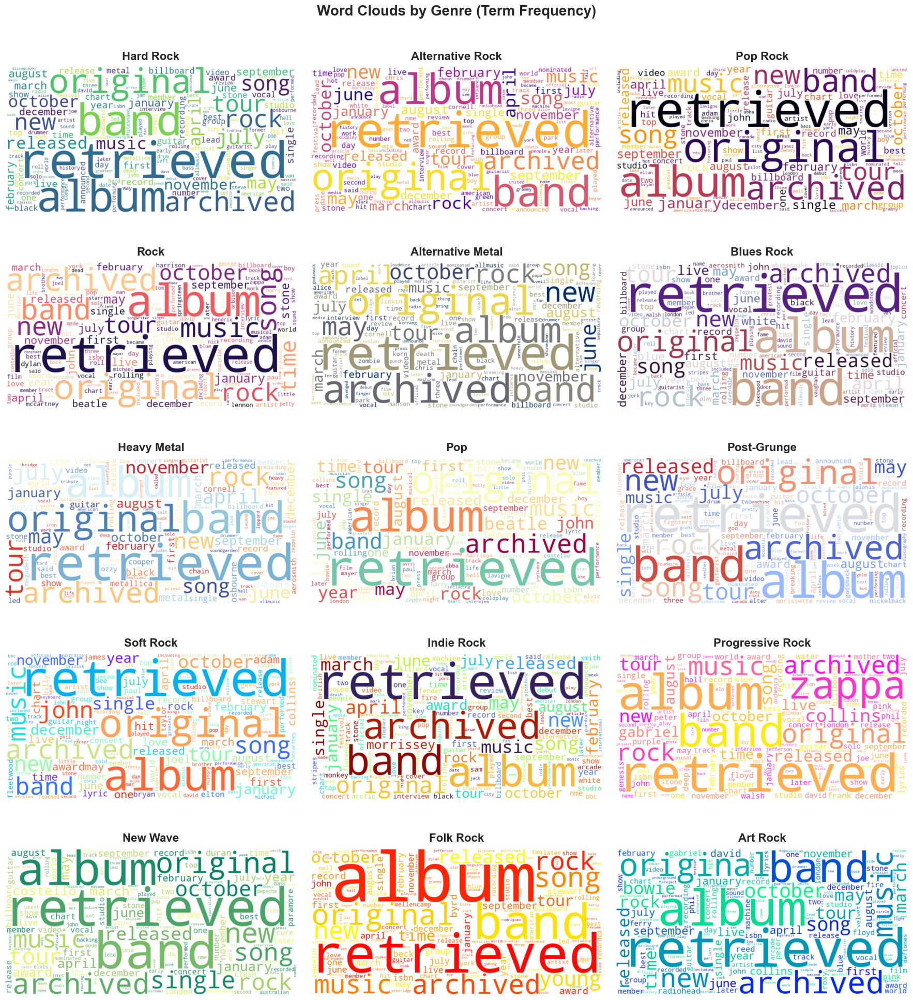


WORD CLOUD ANALYSIS

Top 5 words per genre:
----------------------------------------------------------------------
Hard Rock                      retrieved (9820), band (6950), album (5968), original (5843), archived (5535)
Alternative Rock               retrieved (14273), original (9256), archived (9253), band (9111), album (8322)
Pop Rock                       retrieved (9190), original (6606), archived (6443), album (5553), band (5463)
Rock                           retrieved (7397), original (5223), archived (4944), album (4527), band (3977)
Alternative Metal              retrieved (6230), original (4084), archived (4025), band (3567), album (3425)
Blues Rock                     retrieved (3504), band (2988), album (2238), original (1965), archived (1849)
Heavy Metal                    retrieved (4908), band (3426), original (3001), archived (2856), album (2807)
Pop                            retrieved (5209), original (3773), archived (3633), album (3143), music (2629)
Post-Grung

In [20]:
from lib.WordcloudGenerator import WordcloudGenerator
from lib.TermFrequencyAnalyzer import TermFrequencyAnalyzer, GenreAssignmentMethod

wordcloud_generator = WordcloudGenerator()

# Configuration
print("\nAvailable TF analysis methods:")
methods = [
    GenreAssignmentMethod.ALL_GENRES, 
    GenreAssignmentMethod.FIRST_GENRE, 
    GenreAssignmentMethod.FIRST_NON_ROCK
]
for i, method in enumerate(methods, 1):
    print(f"  {i}. {method}")

# You can change this to use a different method
selected_method = GenreAssignmentMethod.ALL_GENRES  # Change to 'first_genre' or 'first_non_rock' if desired

print(f"\nUsing method: {selected_method}")
print("(You can change 'selected_method' in the script to try other methods)\n")

# Paths
tf_dir = f"../data/rock/tf_analysis_{selected_method}"
tf_file = f"{tf_dir}/term_frequencies.json"

# Check if file exists
if not os.path.exists(tf_file):
    print(f"ERROR: Term frequency file not found at {tf_file}")
    print("Please run term_frequency_analysis.py first!")

genre_tf = loader.load_term_frequencies(tf_file)

wordcloud_generator.create_combined_wordcloud_grid(genre_tf, n_cols=3)

wordcloud_generator.analyze_wordcloud_results(genre_tf)

Using TF analysis method: all_genres
Loaded TF data for 15 genres

Initialized TF-IDF Analyzer:
  - 15 documents (genres)
  - 16204 unique words in vocabulary

Calculating IDF scores (log base: e)...
IDF calculation complete!
  - Min IDF: 0.0000 (common words)
  - Max IDF: 2.7081 (rare words)

Calculating TF-IDF scores (TF variant: log)...
TF-IDF calculation complete!


CREATING TF-IDF WORD CLOUDS

CREATING COMBINED TF-IDF WORD CLOUD GRID


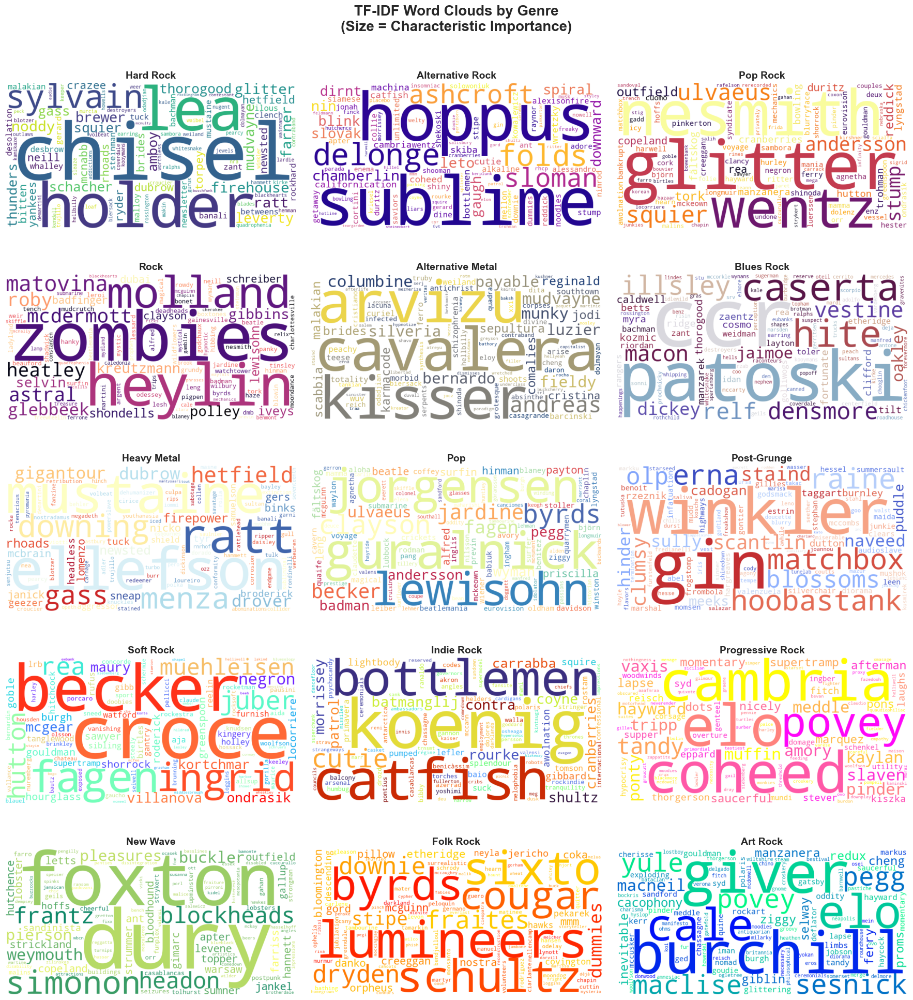

In [21]:
from lib.TFIDFAnalyzer import TFIDFAnalyzer

# Configuration
selected_method = GenreAssignmentMethod.ALL_GENRES

print(f"Using TF analysis method: {selected_method}")

# Paths
tf_dir = f"../data/rock/tf_analysis_{selected_method}"
tf_file = f"{tf_dir}/term_frequencies.json"
output_dir = f"{tf_dir}/tfidf_analysis"

# Check if TF file exists
if not os.path.exists(tf_file):
    print(f"ERROR: Term frequency file not found at {tf_file}")
    print("Please run term_frequency_analysis.py first!")

# Load TF data
genre_tf = loader.load_term_frequencies(tf_file)

# Initialize TF-IDF analyzer
analyzer = TFIDFAnalyzer(genre_tf)

# Calculate IDF
idf_scores = analyzer.calculate_idf(log_base='e')  # Natural logarithm

# Calculate TF-IDF
genre_tfidf = analyzer.calculate_tfidf(idf_scores, tf_variant='log')  # 1 + log(TF)

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Save results
analyzer.save_tfidf_results(genre_tfidf, idf_scores, output_dir)

# Create word clouds
wordcloud_dir = os.path.join(output_dir, 'wordclouds')
analyzer.create_tfidf_wordclouds(genre_tfidf, wordcloud_dir)

# Create combined grid
combined_file = os.path.join(wordcloud_dir, 'all_genres_tfidf_combined.png')
analyzer.create_combined_tfidf_grid(genre_tfidf, combined_file, n_cols=3)

In [ ]:
from lib.TFIDFCommunities import TFIDFCommunities
from lib.TFIDFAnalyzer import TFIDFAnalyzer

communities_generator = TFIDFCommunities()

partition = loader.load_partition(PARTITION_FILEPATH)

artist_texts = communities_generator.extract_texts_from_performers(PERFORMERS_DIR)

if not artist_texts:
    print("ERROR: No texts extracted!")

# Create community documents
community_docs = communities_generator.create_community_documents(artist_texts, partition, top_n=15)

# Compute TF
community_tf = communities_generator.compute_community_tf(community_docs, min_count=5)

# Calculate IDF and TF-IDF
analyzer = TFIDFAnalyzer(community_tf)
idf_scores = analyzer.calculate_idf(log_base='e')
community_tfidf = analyzer.calculate_tfidf(idf_scores, tf_variant='log')

# Save top words
top_words = {}
for comm_name, tfidf_dict in community_tfidf.items():
    sorted_words = sorted(tfidf_dict.items(), 
                            key=lambda x: x[1], 
                            reverse=True)[:20]
    top_words[comm_name] = [{"word": w, "score": float(s)} for w, s in sorted_words]

top_file = os.path.join(output_dir, 'top_community_tfidf_words.json')
with open(top_file, 'w', encoding='utf-8') as f:
    json.dump(top_words, f, indent=2, ensure_ascii=False)
print(f"Top community TF-IDF words saved to {top_file}")

# Create word clouds
wordcloud_dir = os.path.join(output_dir, 'wordclouds')
analyzer.create_tfidf_wordclouds(community_tfidf, wordcloud_dir)

# Create combined grid
combined_file = os.path.join(wordcloud_dir, 'all_communities_tfidf_combined.png')
communities_generator.create_combined_community_grid(community_tfidf, combined_file, n_cols=3)

Partition loaded for 488 artists


## Part 4

In [ ]:
def load_labmt_wordlist(filepath):
    """Loads the LabMT wordlist into a dictionary."""
    labmt_words = {}
    with open(filepath, 'r') as f:
        next(f)  # Skip title
        next(f)  # Skip subtitle
        next(f)  # Skip blank line
        next(f)  # Skip header
        for line in f:
            parts = line.strip().split('\t')
            word = parts[0]
            happiness_score = float(parts[2])
            labmt_words[word] = happiness_score
    return labmt_words

In [ ]:
from lib.SentimentAnalysis import SentimentAnalysis

labmt_words = load_labmt_wordlist('../Week_8/wordlist_week8.txt')

GRAPH_FILEPATH = "../data/rock/performers_graph.json"
PARTITION_FILEPATH = "../data/rock/community_detection_results_partition.json"
loader = Loader()
G = loader.load_network(GRAPH_FILEPATH)

partition = loader.load_partition(PARTITION_FILEPATH)

sentimentAnalysis = SentimentAnalysis()

### Exercise 1: Overall sentiment distribution


In [ ]:
overall_sentiments, node_sentiments, overall_stats = sentimentAnalysis.sentiment_distribution(G, labmt_words)

### Exercise 2: Community sentiment distribution


In [ ]:
sentimentAnalysis.community_sentiment_distribution(G, partition, labmt_words, overall_sentiments, overall_stats)